In [192]:
import pandas as pd 
import re
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

In [28]:
merged = pd.read_csv("/shared/3/projects/benlitterer/localNews/data/interim/SingleNE_85_clustered.tsv", sep="\t")

In [29]:
#look at which outlet first started a story 

#first make sure we have the date of an outlet correctly specified 
merged["date"] = pd.to_datetime(merged["date"])

#group data together 
grouped = merged[["key", "source", "title", "content", "clustNum", "date", "national"]].groupby(by="clustNum").agg(list)
grouped["clustLen"] = grouped["key"].apply(len)

#get first to publish within a cluster 
grouped["first"] = grouped["date"].apply(lambda x: x.index(min(x)))

#get the national or local status for the first article in a cluster 
justFirst = pd.DataFrame({"clustSize":grouped["clustLen"]})
justFirst["national"] = grouped.apply(lambda x: x["national"][x["first"]], axis=1)

#group all the first articles by cluster size (# of articles in a story)
firstGrouped = justFirst.groupby(by=["clustSize"]).agg(list).reset_index()
firstGrouped["natProp"] = firstGrouped["national"].apply(lambda x: sum(x)/len(x))

Text(0.5, 0.98, 'Story Starters: National vs. Local')

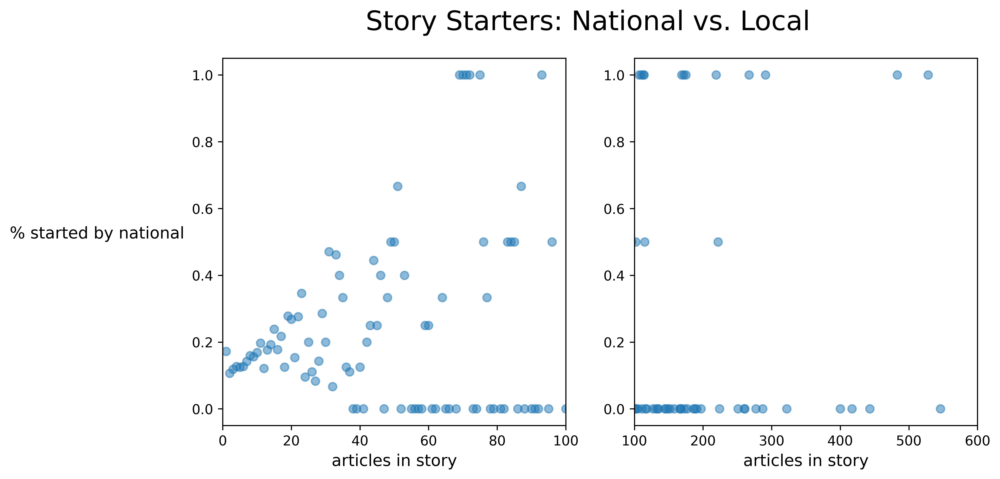

In [30]:
#plot first articles in news story based on local versus national and size of story 
plt.rcParams['figure.dpi'] = 600
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))
axs[0].scatter(firstGrouped["clustSize"], firstGrouped["natProp"], alpha=.5)
axs[0].set_xlabel("articles in story", size=12)
axs[0].set_ylabel("% started by national", rotation=0, labelpad=70, size=12)
axs[0].set_xlim([0, 100])

axs[1].scatter(firstGrouped["clustSize"], firstGrouped["natProp"], alpha=.5)
axs[1].set_xlabel("articles in story", size=12)
#axs[1].set_ylabel("% started by national news", rotation=0, labelpad=70, size=12)
axs[1].set_xlim([100, 600])
fig.suptitle("Story Starters: National vs. Local", size=20)

### Same plot, but bin on the x axis for better understanding when x > 60 

bins
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280]


Text(0.5, 0.98, 'Story Starters: National vs. Local')

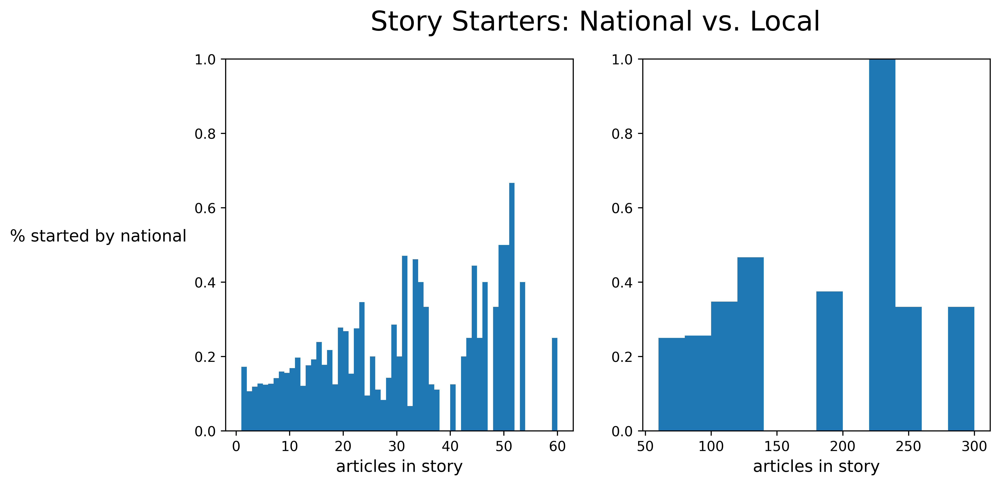

In [32]:
import numpy as np
bins = list(range(0, 61)) + list(np.arange(80, 300, 20))
justFirst["bin"] = pd.cut(justFirst["clustSize"], bins=bins)

#we now have grouping on the x axis. bins of size 1 for first 60, and size 20 for the rest 
groupedBins = justFirst.groupby(by="bin").agg(list).dropna()
groupedBins["nationalProp"] = groupedBins["national"].apply(lambda x: sum(x)/len(x))
groupedBins = groupedBins.reset_index()

groupedBins["right"] = groupedBins["bin"].apply(lambda x: x.right)
groupedBins["nationalProp"]

print("bins")
print(bins)

fig, axs = plt.subplots(ncols=2, figsize=(10,5))

first60 = groupedBins[groupedBins["right"] < 60]
axs[0].bar(first60["right"], first60["nationalProp"], width=1, align="edge")
axs[0].set_xlabel("articles in story", size=12)
axs[0].set_ylabel("% started by national", rotation=0, labelpad=70, size=12)
axs[0].set_ylim([0, 1])

remaining = groupedBins[groupedBins["right"] >= 60]
axs[1].bar(remaining["right"], remaining["nationalProp"], width=20, align="edge")
axs[1].set_xlabel("articles in story", size=12)
axs[1].set_ylim([0, 1])

fig.suptitle("Story Starters: National vs. Local", size=20)

### Just look at story composition 

Text(0.5, 0.98, 'Story Makeup: National vs. Local Coverage')

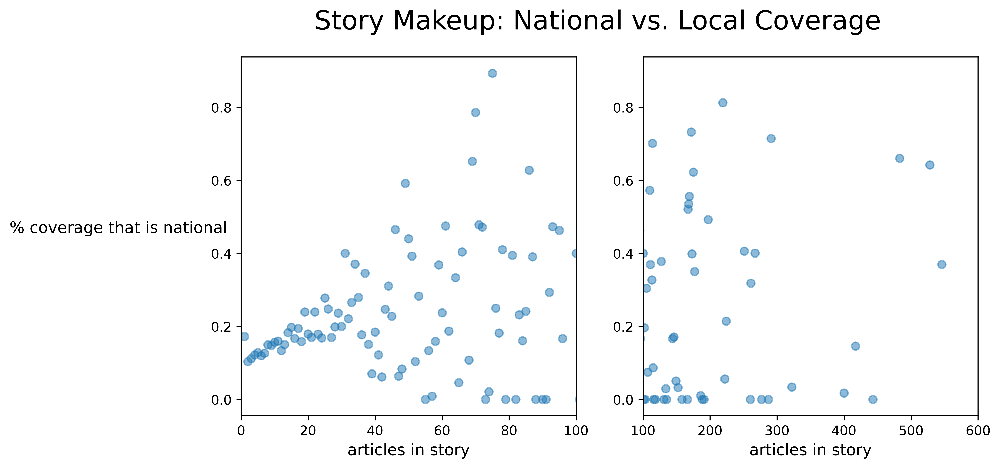

In [33]:
grouped["nationalPercent"] = grouped["national"].apply(lambda x: sum(x)/len(x))

#group again by size of the story (number of articles in story)
clustLenDf = grouped[["clustLen", "nationalPercent"]].groupby(by=["clustLen"]).agg(list).reset_index()

clustLenDf["nationalAverage"] = clustLenDf["nationalPercent"].apply(np.mean)

#plt.scatter(clustLenDf["clustLen"], clustLenDf["nationalAverage"], alpha=.5)
#plt.xlim([0, 100])

plt.rcParams['figure.dpi'] = 600
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))
axs[0].scatter(clustLenDf["clustLen"], clustLenDf["nationalAverage"], alpha=.5)
axs[0].set_xlabel("articles in story", size=12)
axs[0].set_ylabel("% coverage that is national", rotation=0, labelpad=70, size=12)
axs[0].set_xlim([0, 100])

axs[1].scatter(clustLenDf["clustLen"], clustLenDf["nationalAverage"], alpha=.5)
axs[1].set_xlabel("articles in story", size=12)
#axs[1].set_ylabel("% started by national news", rotation=0, labelpad=70, size=12)
axs[1].set_xlim([100, 600])
fig.suptitle("Story Makeup: National vs. Local Coverage", size=20)

## Create a map using geographic links/time series? 

In [70]:
## first try to just plot on a static us map 
import geopandas as gpd
from shapely.geometry import Point, LineString

In [164]:
states = gpd.read_file("/home/blitt/reference/geospatial/shapeFiles/cb_2018_us_state_5m")

#revisit projection at some point to double check. Looks close enough for our purposes, for now 
print(states.crs)

states.head(2)

epsg:4269


,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,31,01779792,0400000US31,31,NE,Nebraska,00,198956658395,1371829134,"POLYGON ((-104.05351 41.15726, -104.05267 41.2..."
1,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217..."


In [165]:
#local sources with long lat data 
localDf = merged[merged["national"] == False].dropna(subset=["lon", "lat"])

#since each source has the same exact location we only need one row per source 
localDf = localDf.drop_duplicates(subset=["source"])
print(len(localDf))

articlePoints = [Point(lonLat[0], lonLat[1]) for lonLat in zip(localDf["lon"], localDf["lat"])]
pointGdf = gpd.GeoDataFrame(localDf, geometry=articlePoints)

251


(10.0, 75.0)

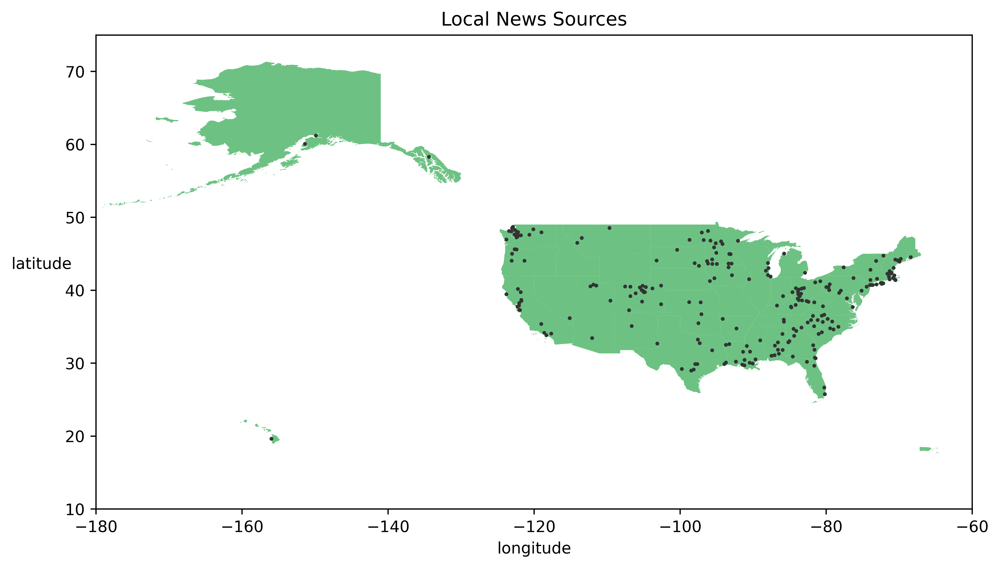

In [190]:
pointGdf.plot(ax=states.plot(figsize=(10, 6), color="#6dc283"), color="#323333", marker = "o", markersize=2)
plt.title("Local News Sources")
plt.xlabel("longitude")
plt.ylabel("latitude", rotation=0, labelpad=15)
plt.xlim([-180, -60])
plt.ylim([10, 75])

In [141]:
#now try to visualize lines between outlets!
localDf = merged[merged["national"] == False].dropna(subset=["lon", "lat"])
localDf["latLon"] = list(zip(localDf["lon"], localDf["lat"],))
localGrouped = localDf[["source", "date", "latLon", "clustNum"]].groupby(by=["clustNum"]).agg(list)

"""
def getPairwise(inList): 
    return [(item1, item2) for item2 in inList for item1 in inList]

localGrouped["source"] = localGrouped["source"].apply(getPairwise)
localGrouped["date"] = localGrouped["date"].apply(getPairwise)
localGrouped["latLon"] = localGrouped["latLon"].apply(getPairwise)

exploded = localGrouped.apply(pd.Series.explode)
"""
#exploded.head()


'\ndef getPairwise(inList): \n    return [(item1, item2) for item2 in inList for item1 in inList]\n\nlocalGrouped["source"] = localGrouped["source"].apply(getPairwise)\nlocalGrouped["date"] = localGrouped["date"].apply(getPairwise)\nlocalGrouped["latLon"] = localGrouped["latLon"].apply(getPairwise)\n\nexploded = localGrouped.apply(pd.Series.explode)\n'

In [142]:
localGrouped["storySize"] = localGrouped["source"].apply(len)
localGrouped = localGrouped[(localGrouped["storySize"] <= 500) & (localGrouped["storySize"] >= 3)]

localGrouped["source"] = localGrouped["source"].apply(getPairwise)
localGrouped["date"] = localGrouped["date"].apply(getPairwise)
localGrouped["latLon"] = localGrouped["latLon"].apply(getPairwise)

In [143]:
localGrouped

,source,date,latLon,storySize
clustNum,,,,
1,"[(dailydemocrat, dailydemocrat), (theenterpris...","[(2021-07-01 00:00:00, 2021-07-01 00:00:00), (...","[((-121.7732971, 38.6785157), (-121.7732971, 3...",3
2,"[(dailydemocrat, dailydemocrat), (redbluffdail...","[(2021-08-30 00:00:00, 2021-08-30 00:00:00), (...","[((-121.7732971, 38.6785157), (-121.7732971, 3...",6
9,"[(bostonherald, bostonherald), (murrysvillesta...","[(2021-07-01 00:00:00, 2021-07-01 00:00:00), (...","[((-71.0588801, 42.3600825), (-71.0588801, 42....",17
11,"[(thekennebecjournal, thekennebecjournal), (wi...","[(2021-07-10 00:00:00, 2021-07-10 00:00:00), (...","[((-69.7794897, 44.31062410000001), (-69.77948...",4
16,"[(contracostatimes, contracostatimes), (inland...","[(2021-07-21 00:00:00, 2021-07-21 00:00:00), (...","[((-122.0651819, 37.9100783), (-122.0651819, 3...",8
...,...,...,...,...
138403,"[(wadenapioneerjournal, wadenapioneerjournal),...","[(2021-08-28 00:00:00, 2021-08-28 00:00:00), (...","[((-95.1361386, 46.4424614), (-95.1361386, 46....",4
138473,"[(dailyrecord, dailyrecord), (thelamardailynew...","[(2021-05-24 00:00:00, 2021-05-24 00:00:00), (...","[((-105.2253316, 38.4494063), (-105.2253316, 3...",4
138903,"[(dailyrecord, dailyrecord), (thelamardailynew...","[(2021-07-13 00:00:00, 2021-07-13 00:00:00), (...","[((-105.2253316, 38.4494063), (-105.2253316, 3...",3


In [144]:
exploded = localGrouped.apply(pd.Series.explode)

In [145]:
#easiest version doesn't take time into account. Simply group by pairs and then count the group size 
pairGroups = exploded[["source", "latLon"]].groupby(by="source").agg(list)
pairGroups["edgeWeight"] = pairGroups["latLon"].apply(len)
pairGroups["latLon"] = pairGroups["latLon"].apply(lambda x: x[0])
lines = [LineString(item) for item in pairGroups["latLon"]]

lineGdf = gpd.GeoDataFrame(pairGroups, geometry=lines)

(array([12730.,  2263.,  1111.,   766.,   457.,   490.,   352.,   296.,
          202.,   196.]),
 array([ 1. , 10.8, 20.6, 30.4, 40.2, 50. , 59.8, 69.6, 79.4, 89.2, 99. ]),
 <BarContainer object of 10 artists>)

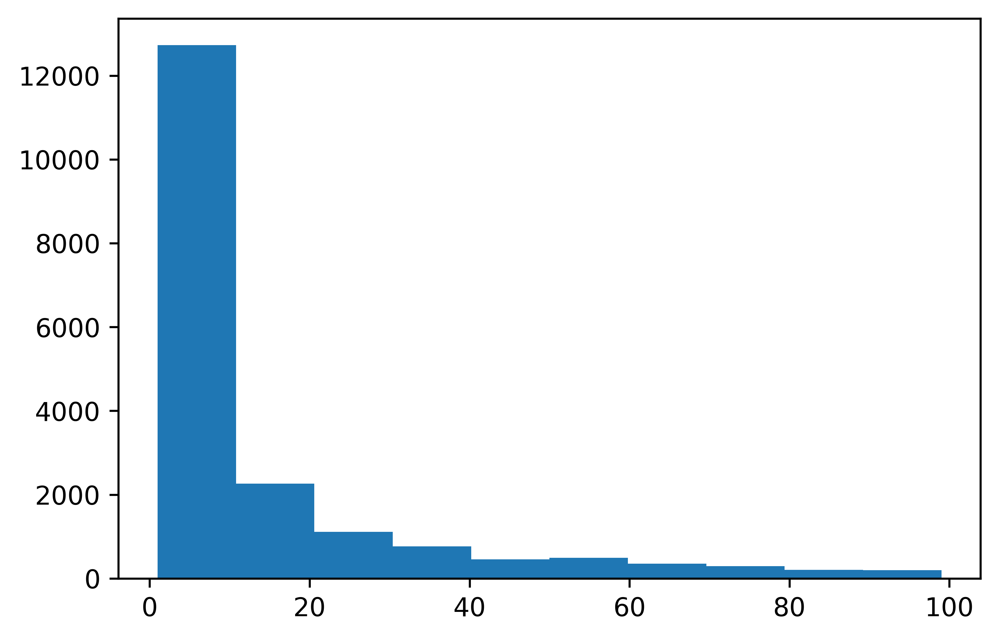

In [153]:
plt.hist(lineGdf.loc[lineGdf["edgeWeight"] < 100]["edgeWeight"])


(10.0, 75.0)

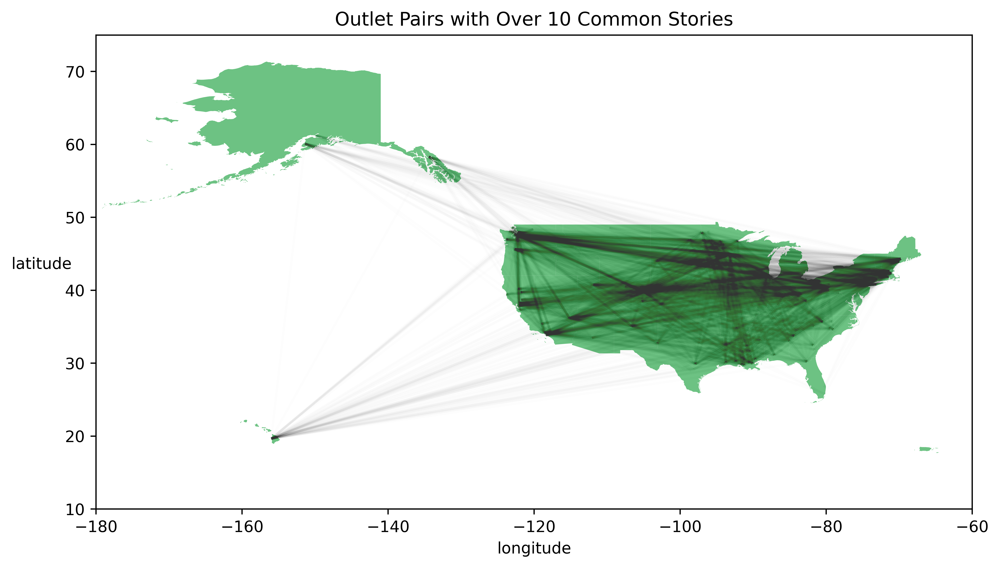

In [181]:
over10Gdf = lineGdf[lineGdf["edgeWeight"] > 10]
over10Gdf.plot(ax=states.plot(figsize=(10, 6), color="#6dc283"), color="#323333", alpha=.003)
#need to think about scaling for the number of articles produced? 
#obviously small outlets aren't going to have many connections 
plt.title("Outlet Pairs with Over 10 Common Stories")
plt.xlabel("longitude")
plt.ylabel("latitude", rotation=0, labelpad=15)
plt.xlim([-180, -60])
plt.ylim([10, 75])

(10.0, 75.0)

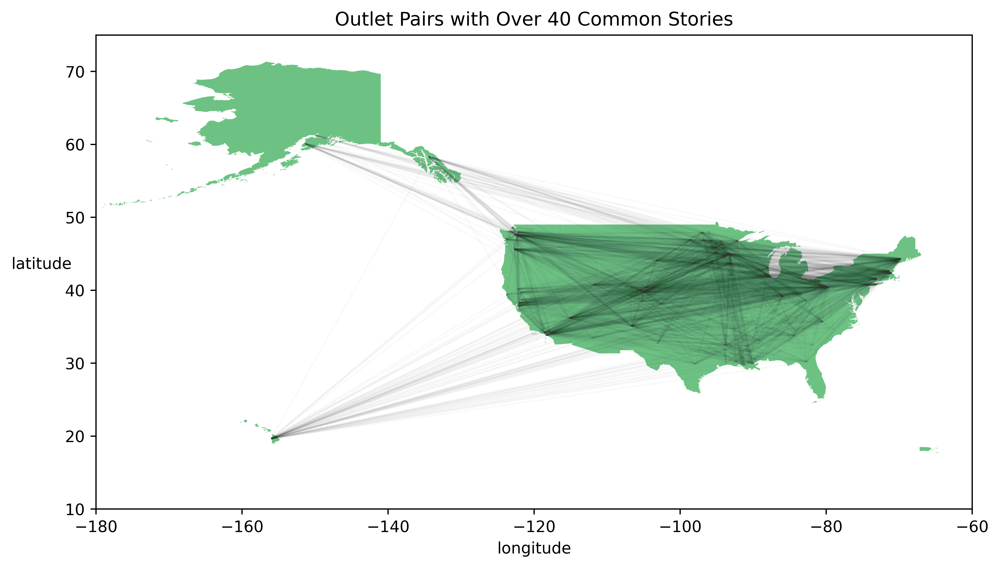

In [187]:
storyCutoff = 40
over40Gdf = lineGdf[lineGdf["edgeWeight"] > storyCutoff]
#was using  color="#323333",
#OR column="edgeWeight"
over40Gdf.plot(ax=states.plot(figsize=(10, 6), color="#6dc283"), linewidth=1, alpha=.010, color="#323333", legend=True)
#need to think about scaling for the number of articles produced? 
#obviously small outlets aren't going to have many connections 
plt.title("Outlet Pairs with Over " + str(storyCutoff) +  " Common Stories")
plt.xlabel("longitude")
plt.ylabel("latitude", rotation=0, labelpad=15)
plt.xlim([-180, -60])
plt.ylim([10, 75])

(10.0, 75.0)

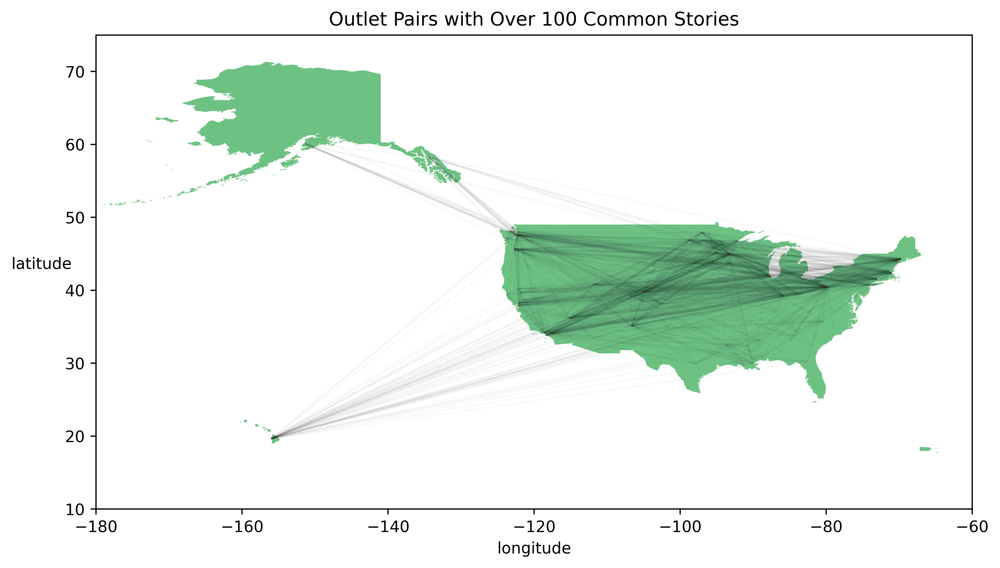

In [191]:
storyCutoff = 100
over40Gdf = lineGdf[lineGdf["edgeWeight"] > storyCutoff]
#was using  color="#323333",
#OR column="edgeWeight"
over40Gdf.plot(ax=states.plot(figsize=(10, 6), color="#6dc283"), linewidth=1, alpha=.010, color="#323333", legend=True)
#need to think about scaling for the number of articles produced? 
#obviously small outlets aren't going to have many connections 
plt.title("Outlet Pairs with Over " + str(storyCutoff) +  " Common Stories")
plt.xlabel("longitude")
plt.ylabel("latitude", rotation=0, labelpad=15)
plt.xlim([-180, -60])
plt.ylim([10, 75])

## Create outlet level graph for better visualization 

In [194]:
merged.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'article_id',
       'sourcedomain_id', 'date', 'title', 'content', 'url_x', 'fips',
       'source', 'description', 'onlinesince', 'rank', 'state', 'city', 'lon',
       'lat', 'county', 'total_population', 'white_pct', 'black_pct',
       'hispanic_pct', 'nonwhite_pct', 'foreignborn_pct', 'female_pct',
       'age29andunder_pct', 'age65andolder_pct', 'median_hh_inc',
       'clf_unemploy_pct', 'lesshs_pct', 'lesscollege_pct',
       'lesshs_whites_pct', 'lesscollege_whites_pct', 'rural_pct',
       'ruralurban_cc', 'predrt_0', 'predrt_12', 'predrt_3', 'national', 'id',
       'author', 'url', 'published', 'published_utc', 'collection_utc', 'key',
       'namedEntities', 'embedding', 'clustNum'],
      dtype='object')

### The question here is: 
if we have, within a given cluster, (outlet_1, outlet_2, outlet_1, outlet_3) as our timeline, do we think that 
influence is occuring from outlet_2 to outlet_1. The less nuanced and easier question revolves around when a particular
topic or news event to cover is introduced, and since outlet_3 doesn't introduce anything completely new to outlet 1
then we say no. At some point we should consider the reverse case. 

In [283]:
#get pairwise information
#by sorting in this way then calling drop_duplicates, we only consider the first mention of a story by 
#an outlet. Simplifies the analysis but introduces an assumption 
#example: merged.head(300)[["clustNum", "source", "date"]].sort_values(["clustNum", "source", "date"]).head(20)
pairwise = merged.sort_values(["clustNum", "source", "date"]).drop_duplicates(subset=["clustNum", "source"])

#group into clusters
pairwise = pairwise.drop(columns=["Unnamed: 0", "Unnamed: 0.1", "Unnamed: 0.1.1", "content", "embedding", "namedEntities"])
pairwise = pairwise.groupby(by="clustNum").agg(list)
pairwise["clustSize"] = pairwise["key"].apply(len)
pairwise = pairwise[pairwise["clustSize"] < 600].drop(columns=["clustSize"])




In [284]:

def getPairwise(inList): 
    if type(inList) == float: 
        print(len(inList))
        print(inList)
        
    return [(item1, item2) for item2 in inList for item1 in inList]

#applied across an entire series 
def getPairwiseSeries(inSeries): 
    return inSeries.apply(getPairwise)

pairwise = pairwise.apply(getPairwiseSeries)
pairwise = pairwise.apply(pd.Series.explode)
pairwise[["date1", "date2"]] = pd.DataFrame(pairwise["date"].tolist(), index=pairwise.index)

In [285]:
pairwise.shape

(653030, 45)

In [286]:
def getFirst(inList):
    return inList[0]

aggDict = {
    "article_id":list, 
    "sourcedomain_id":getFirst, 
    "date":list, 
    "title":list, 
    "url_x":list, 
    "fips":list, 
    "source":getFirst, 
    "description":list, 
    "onlinesince":getFirst, 
    "rank":getFirst, 
    "state":getFirst, 
    "city":getFirst, 
    "lon":getFirst,
    "lat":getFirst, 
    "county":getFirst, 
    "total_population":getFirst, 
    "white_pct":getFirst, 
    "national":getFirst,
    "date1":list, 
    "date2":list
}

In [287]:
#keep only pairs where one outlet preceeds the other 
pairwise = pairwise[np.where(pairwise["date1"] < pairwise["date2"], True, False)]

#now group by pairs or outlets. 
#TODO: make it so that outlet level info is not in a list and article level info IS
outletEdges = pairwise.groupby(by="source").agg(list)
outletEdges["weight"] = outletEdges["key"].apply(len)

In [298]:
outletEdges["lat"] = outletEdges["lat"].apply(lambda x: x[0])
outletEdges["lon"] = outletEdges["lon"].apply(lambda x: x[0])

In [304]:
outletEdges[["lat1", "lat2"]] = pd.DataFrame(outletEdges["lat"].tolist(), index=outletEdges.index)
outletEdges[["lon1", "lon2"]] = pd.DataFrame(outletEdges["lon"].tolist(), index=outletEdges.index)

In [368]:
outletEdges[["state1", "state2"]] = pd.DataFrame(outletEdges["state"].apply(getFirst).tolist(), index=outletEdges.index)

In [369]:
localEdges = outletEdges.dropna(subset=["lat1", "lat2", "lon1", "lon2"])

In [370]:
zippedCols = list(zip(localEdges["lon1"], localEdges["lat1"], localEdges["lon2"], localEdges["lat2"]))
lines = [LineString([(item[0], item[1]),(item[2], item[3])]) for item in zippedCols]

In [371]:
localEdgesGdf = gpd.GeoDataFrame(localEdges, geometry=lines)

In [372]:
localEdgesGdf[["weight", "geometry"]]

,weight,geometry
source,,
"(addisoncountyindependent, bartonchronicle)",1,"LINESTRING (-73.16734 44.01534, -72.17626 44.7..."
"(addisoncountyindependent, cascadebusinessnews)",1,"LINESTRING (-73.16734 44.01534, -121.31531 44...."
"(addisoncountyindependent, chronicleindependent)",1,"LINESTRING (-73.16734 44.01534, -80.60702 34.2..."
"(addisoncountyindependent, claytontribune)",1,"LINESTRING (-73.16734 44.01534, -83.40099 34.8..."
"(addisoncountyindependent, fallschurchnewspress)",1,"LINESTRING (-73.16734 44.01534, -77.17109 38.8..."
...,...,...
"(yellowspringsnews, thewanderer)",1,"LINESTRING (-83.88687 39.80645, -70.81507 41.6..."
"(yellowspringsnews, vancouverbusinessjournal)",1,"LINESTRING (-83.88687 39.80645, -122.67609 45...."
"(yellowspringsnews, vashonmauryislandbeachcomber)",1,"LINESTRING (-83.88687 39.80645, -122.45985 47...."


Text(0.5, 0.98, 'Metro-Area News Networks')

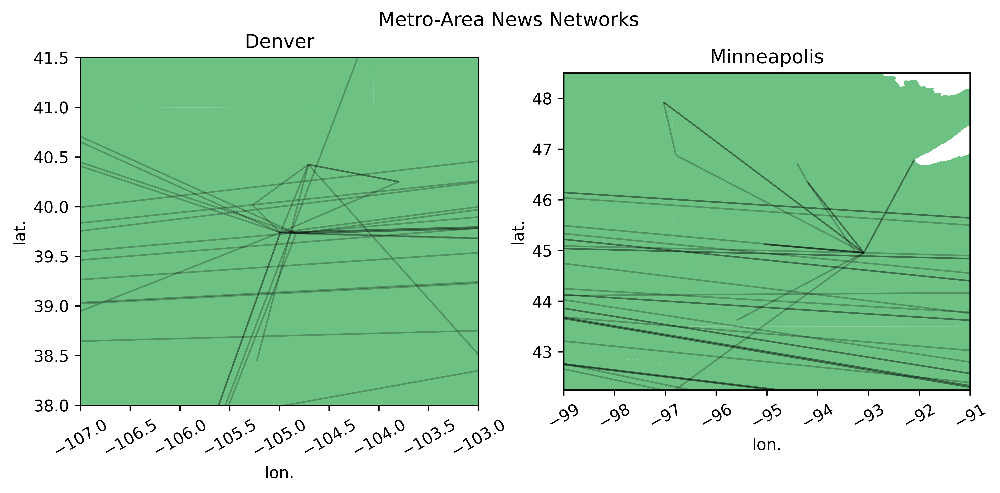

In [479]:
#first try top 200 weights
cols = 2
fig, axs = plt.subplots(ncols=cols, figsize=(10, 4))
xlims = [[-107, -103], [-98.5, -91.5]]
ylims = [[38, 41.5], [42.25, 48.5]]
metroNames = ["Denver", "Minneapolis"]

i = 0 
for k in range(cols): 
    top200 = localEdgesGdf.sort_values("weight", ascending=False).head(200)
    states.plot(color="#6dc283", ax=axs[k])
    top200.plot(ax=axs[k],alpha=.25, legend=True, linewidth=1, color="black")
    axs[k].set_xlim(xlims[i])
    axs[k].set_ylim(ylims[i])
    plt.draw()
    axs[k].set_xticks(axs[k].get_xticks())
    axs[k].set_xticklabels(axs[k].get_xticklabels(), rotation=30)
    axs[k].set_title(metroNames[i])
    axs[k].set_xlabel("lon.")
    axs[k].set_ylabel("lat.")
    
    i += 1
    #need to think about scaling for the number of articles produced? 
    #obviously small outlets aren't going to have many connections 
    #plt.title("Outlet Pairs with Over 10 Common Stories")
    #plt.xlabel("longitude")
    #plt.ylabel("latitude", rotation=0, labelpad=15)

fig.suptitle("Metro-Area News Networks")

In [484]:
top200["city"]

27655    [(Seattle, Vancouver), (Seattle, Vancouver), (...
27691    [(Seattle, Columbus), (Seattle, Columbus), (Se...
22657    [(Denver, Greeley), (Denver, Greeley), (Denver...
27506    [(Seattle, Albuquerque), (Seattle, Albuquerque...
735      [(Albuquerque, Vancouver), (Albuquerque, Vanco...
                               ...                        
21235    [(Vancouver, Lowell), (Vancouver, Lowell), (Va...
5963     [(Arlington Heights, Murrysville), (Arlington ...
6084     [(Arlington Heights, Kailua Kona), (Arlington ...
6489     [(Woodland Hills, Seattle), (Woodland Hills, S...
9650     [(Grand Forks, Fargo), (Grand Forks, Fargo), (...
Name: city, Length: 200, dtype: object

### Try to split up into edges coming into and out of these areas 

In [ ]:
localEdgesGdf = localEdgesGdf.reset_index()
localEdgesGdf[["source1", "source2"]] = pd.DataFrame(localEdgesGdf["source"].tolist(), index=localEdgesGdf.index)
localEdgesGdf[["city1", "city2"]] = pd.DataFrame(localEdges["city"].apply(getFirst).tolist(), index=localEdgesGdf.index)


In [497]:
#remember that city1 preceeds city2, so if we want cities influencing we take cities in the left column 
top200 = localEdgesGdf.sort_values("weight", ascending=False).head(200)
fromMinn = top200.loc[((top200["city1"] == "Minneapolis") | (top200["city1"] == "St. Paul")) & ((top200["city2"] != "Minneapolis") & (top200["city2"] != "St. Paul")), ["weight", "source", "geometry"]]
toMinn = top200.loc[((top200["city2"] == "Minneapolis") | (top200["city2"] == "St. Paul")) & ((top200["city1"] != "Minneapolis") & (top200["city1"] != "St. Paul")), ["weight", "source", "geometry"]]


17682    72
17615    71
17513    70
17527    68
17631    58
17503    51
19305    50
19372    48
Name: weight, dtype: int64
27631    57
30977    54
711      53
21183    49
25447    49
20643    49
9614     49
7737     47
Name: weight, dtype: int64


Text(0.5, 0.98, "Direction of 'Influence': Minneapolis-St. Paul")

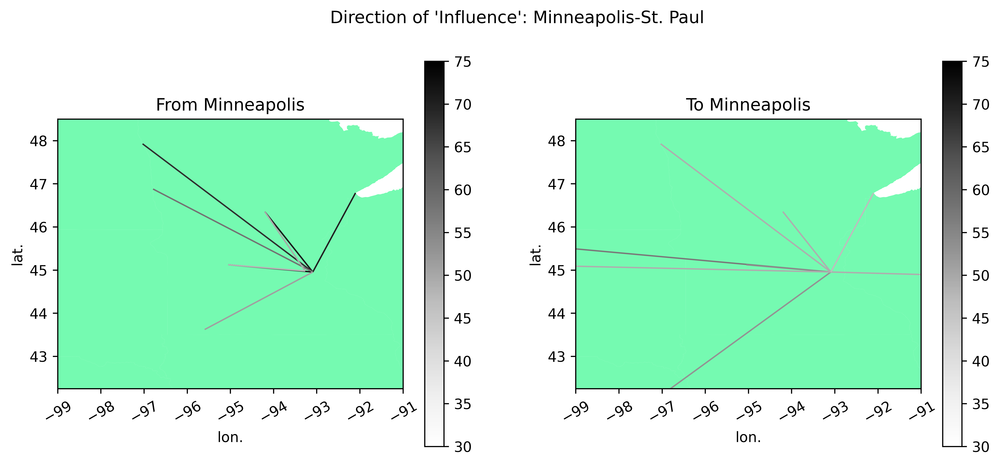

In [538]:

#first try top 200 weights
dfs = [fromMinn, toMinn]
cols = 2

fig, axs = plt.subplots(ncols=cols, figsize=(12, 5))
xlims = [[-98.5, -91.5], [-98.5, -91.5]]
ylims = [[42.25, 48.5], [42.25, 48.5]]
metroNames = ["From Minneapolis", "To Minneapolis"]

i = 0 
for k in range(cols): 
    df = dfs[i].sort_values("weight", ascending=False).head(200)
    states.plot(color="#75fab1", ax=axs[k])
    print(df["weight"])
    df.plot(ax=axs[k],alpha=1, legend=True, linewidth=1, column="weight", cmap="Greys", vmin=30, vmax=75)
    axs[k].set_xlim(xlims[i])
    axs[k].set_ylim(ylims[i])
    plt.draw()
    axs[k].set_xticks(axs[k].get_xticks())
    axs[k].set_xticklabels(axs[k].get_xticklabels(), rotation=30)
    axs[k].set_title(metroNames[i])
    axs[k].set_xlabel("lon.")
    axs[k].set_ylabel("lat.")
    
    i += 1
    #need to think about scaling for the number of articles produced? 
    #obviously small outlets aren't going to have many connections 
    #plt.title("Outlet Pairs with Over 10 Common Stories")
    #plt.xlabel("longitude")
    #plt.ylabel("latitude", rotation=0, labelpad=15)

fig.suptitle("Direction of 'Influence': Minneapolis-St. Paul")

In [536]:
cityList = ["Denver", "Aurora"]
fromDenverBoulder = top200.loc[(top200["city1"].isin(cityList)) & (~top200["city2"].isin(cityList)), ["weight", "source", "geometry"]]
toDenverBoulder = top200.loc[(top200["city2"].isin(cityList)) & (~top200["city1"].isin(cityList)), ["weight", "source", "geometry"]]

22657    177
22650     62
22598     59
22750     49
22811     48
Name: weight, dtype: int64
591      90
27512    89
27663    84
743      79
21062    69
21214    64
15656    62
25326    62
25480    61
13753    61
26954    52
27106    50
13602    47
15505    47
Name: weight, dtype: int64


Text(0.5, 0.98, "Direction of 'Influence': Denver")

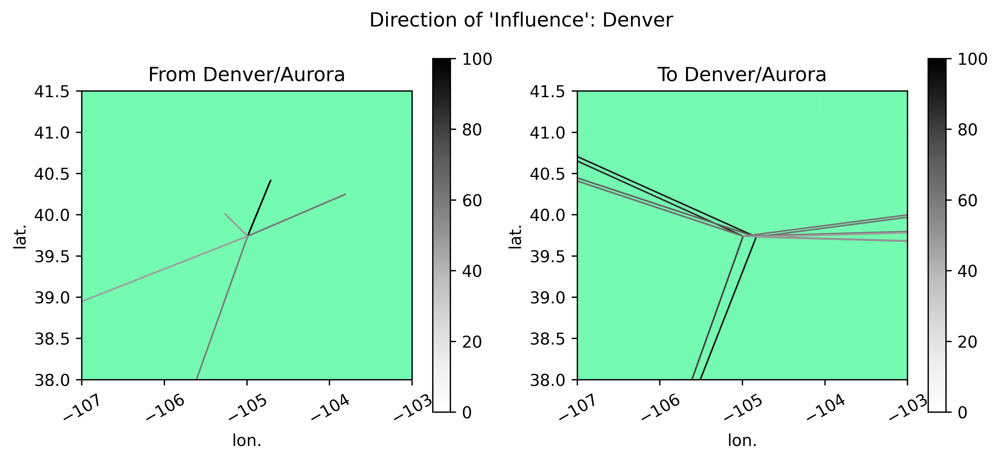

In [539]:

#first try top 200 weights
dfs = [fromDenverBoulder, toDenverBoulder]
cols = 2

fig, axs = plt.subplots(ncols=cols, figsize=(10, 4))
xlims = [[-107, -103], [-107, -103]]
ylims = [[38, 41.5], [38, 41.5]]
metroNames = ["From Denver/Aurora", "To Denver/Aurora"]

i = 0 
for k in range(cols): 
    df = dfs[i].sort_values("weight", ascending=False).head(200)
    states.plot(color="#75fab1", ax=axs[k])
    print(df["weight"])
    df.plot(ax=axs[k],alpha=1, legend=True, linewidth=1, column="weight", cmap="Greys", vmin=0, vmax=100)
    axs[k].set_xlim(xlims[i])
    axs[k].set_ylim(ylims[i])
    plt.draw()
    axs[k].set_xticks(axs[k].get_xticks())
    axs[k].set_xticklabels(axs[k].get_xticklabels(), rotation=30)
    axs[k].set_title(metroNames[i])
    axs[k].set_xlabel("lon.")
    axs[k].set_ylabel("lat.")
    
    i += 1
    #need to think about scaling for the number of articles produced? 
    #obviously small outlets aren't going to have many connections 
    #plt.title("Outlet Pairs with Over 10 Common Stories")
    #plt.xlabel("longitude")
    #plt.ylabel("latitude", rotation=0, labelpad=15)

fig.suptitle("Direction of 'Influence': Denver")

In [509]:
top200[["state1", "state2"]] = pd.DataFrame(top200["state"].apply(getFirst).tolist(), index=top200.index)

In [511]:
top200.loc[(top200["state1"] == "Colorado") | (top200["state2"] == "Colorado"), ["source", "weight"]]

,source,weight
22657,"(thedenverpost, greeleytribune)",177
25605,"(thelamardailynews, greeleytribune)",111
6580,"(dailyrecord, greeleytribune)",110
9053,"(fortmorgantimes, greeleytribune)",104
591,"(albuquerquejournal, aurorasentinel)",90
27512,"(theseattletimes, aurorasentinel)",89
27663,"(theseattletimes, thedenverpost)",84
743,"(albuquerquejournal, thedenverpost)",79
22604,"(thedenverpost, aurorasentinel)",74
21062,"(thecolumbian, aurorasentinel)",69


### Doesn't really work to use weighted edges... 

(20.0, 50.0)

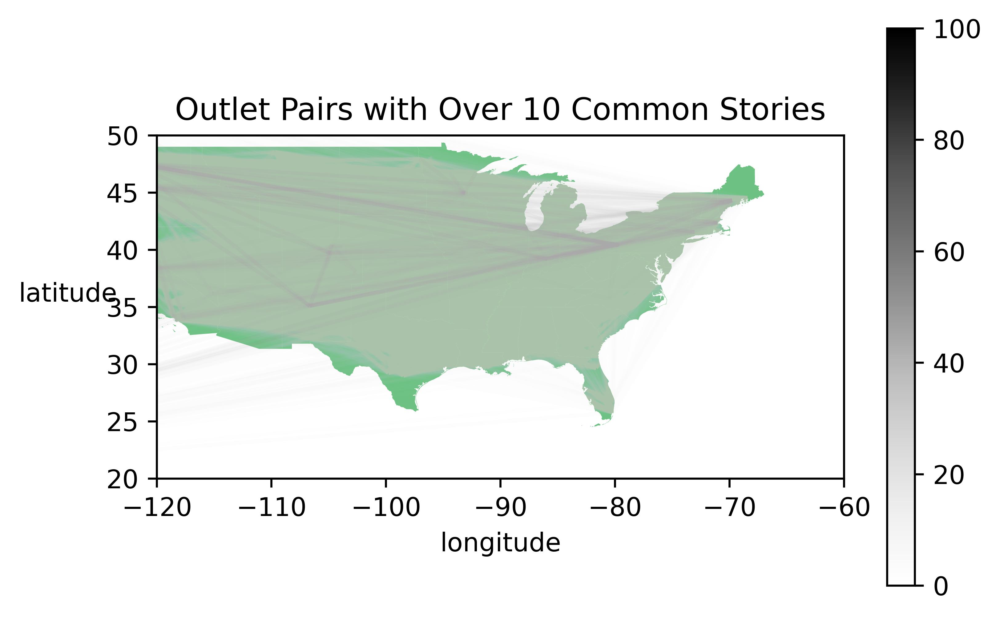

In [433]:
localEdgesGdf.plot(ax=states.plot(figsize=(6, 4), color="#6dc283"), column="weight", alpha=.01, legend=True, cmap="Greys", vmin=0, vmax=100)
#need to think about scaling for the number of articles produced? 
#obviously small outlets aren't going to have many connections 
plt.title("Outlet Pairs with Over 10 Common Stories")
plt.xlabel("longitude")
plt.ylabel("latitude", rotation=0, labelpad=15)
plt.xlim([-120, -60])
plt.ylim([20, 50])

In [544]:
#the dataframe with the outlets needed to make our networkx graph 
outletEdges.head(3)

,article_id,sourcedomain_id,date,title,url_x,fips,description,onlinesince,rank,state,...,key,date1,date2,weight,lat1,lat2,lon1,lon2,state1,state2
source,,,,,,,,,,,,,,,,,,,,,
"(abcnews, addisoncountyindependent)","[(nan, addisoncountyindependent--2021-07-29--V...","[(nan, addisoncountyindependent-addisonindepen...","[(2021-05-01 00:00:00, 2021-07-29 00:00:00)]",[(Prosecutors seek higher sentence for Chauvin...,"[(nan, https://addisonindependent.com/news/ver...","[(nan, 50001.0)]","[(nan, Bi-weekly newspaper distributed in the ...","[(nan, 12-Jan-1997)]","[(nan, 1011377)]","[(nan, Vermont)]",...,[(abcnews_Prosecutors_seek_higher_sentence_for...,[2021-05-01 00:00:00],[2021-07-29 00:00:00],1,NaN,44.015337,NaN,-73.167340,NaN,Vermont
"(abcnews, advertiserdemocrat)","[(nan, advertiserdemocrat--2021-06-23--Movie R...","[(nan, advertiserdemocrat-sunjournal.com)]","[(2021-06-20 00:00:00, 2021-06-23 00:00:00)]",[(‘The Hitman’s Wife’s Bodyguard’ hits top mar...,"[(nan, https://www.sunjournal.com/2021/06/23/m...","[(nan, 23017.0)]","[(nan, Provides national, regional, and local ...","[(nan, 03-Mar-1997)]","[(nan, 201689)]","[(nan, Maine)]",...,[(abcnews_‘The_Hitman’s_Wife’s_Bodyguard’_hits...,[2021-06-20 00:00:00],[2021-06-23 00:00:00],1,NaN,44.213957,NaN,-70.544810,NaN,Maine
"(abcnews, alamedatimesstar)","[(nan, alamedatimesstar--2021-05-03--Bay Area ...","[(nan, alamedatimesstar-eastbaytimes.com), (na...","[(2021-05-01 00:00:00, 2021-05-03 00:00:00), (...",[(Prosecutors seek higher sentence for Chauvin...,"[(nan, https://www.eastbaytimes.com/2021/05/03...","[(nan, 6001.0), (nan, 6001.0), (nan, 6001.0), ...","[(nan, A daily newspaper with a full range of ...","[(nan, None), (nan, None), (nan, None), (nan, ...","[(nan, 53056), (nan, 53056), (nan, 53056), (na...","[(nan, California), (nan, California), (nan, C...",...,[(abcnews_Prosecutors_seek_higher_sentence_for...,"[2021-05-01 00:00:00, 2021-06-19 00:00:00, 202...","[2021-05-03 00:00:00, 2021-06-20 00:00:00, 202...",5,NaN,37.779872,NaN,-122.282185,NaN,California


In [558]:
graphDf = outletEdges.reset_index()
graphDf[["source1", "source2"]] = pd.DataFrame(graphDf["source"].tolist(), index=graphDf.index)

In [554]:
#generate a configuration model/random graph with the same edge distribution 
weights = graphDf["weight"]

0         1
1         1
2         5
3         3
4        14
         ..
37240     1
37241     1
37242     1
37243     1
37244     1
Name: weight, Length: 37245, dtype: int64

In [616]:
#create graph from pandas dataframe 
outletGraph = nx.from_pandas_edgelist(graphDf[["source1", "source2", "weight"]], source="source1", target="source2", edge_attr="weight", create_using=nx.DiGraph)

#add node attributes (i.e. population etc... ) to nodes that represent local outlets 
onlyLocal = merged[merged["national"] == False].drop_duplicates(subset="source") 
demographicDict = onlyLocal[["source", "total_population", "white_pct", "black_pct", "hispanic_pct", "nonwhite_pct", "rural_pct", "lesshs_pct", "lesscollege_pct", "median_hh_inc"]].set_index("source").to_dict(orient="index")
nx.set_node_attributes(outletGraph, demographicDict)

In [676]:
from tqdm import tqdm 
#bootstrap the distribution of the number of edges where influence flows from more populous to less populous and 
#vice versa 

popInfluenceDist = []
noPopInfluenceDist = []
samePopDist = []
for i in tqdm(range(200)): 
    #create config model 
    #the config model creates a graph with the number of in and out degrees that we see in our graph 
    #the nodes are random though, so we are assuming that there is no relationship between 
    #any node characteristics and their degrees 
    configModel = nx.directed_configuration_model(inDegree, outDegree)

    #set the config model to have the same nodes and attributes as the original model 
    nodeMapping = dict(zip(list(configModel.nodes()), list(outletGraph.nodes())))
    configModel = nx.relabel_nodes(configModel, nodeMapping)
    nx.set_node_attributes(configModel, demographicDict)

    edgeDf = nx.to_pandas_edgelist(configModel)
    justPop = onlyLocal[["source", "total_population"]]
    temp = pd.merge(edgeDf, justPop, how="right", on="source").rename(columns={"total_population":"total_population1"})
    justPop["target"] = justPop["source"]
    merged = pd.merge(temp, justPop, how="right", on="target").rename(columns={"total_population":"total_population2"})
    #merged["greaterPop"] = merged[merged]

    influencedByPop = len(merged.loc[merged["total_population1"] < merged["total_population2"]])
    notInfluencedByPop = len(merged.loc[merged["total_population1"] > merged["total_population2"]])
    samePop = len(merged.loc[merged["total_population1"] == merged["total_population2"]])
    
    popInfluenceDist.append(influencedByPop)
    noPopInfluenceDist.append(notInfluencedByPop)
    samePopDist.append(samePop)

  0%|          | 0/200 [00:00<?, ?it/s]<ipython-input-676-19acb504777a>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  justPop["target"] = justPop["source"]
100%|██████████| 200/200 [04:33<00:00,  1.37s/it] 


In [673]:
#get stats on how many directed edges go from higher->lower or lower->higher 
edgeDf = nx.to_pandas_edgelist(outletGraph)
justPop = onlyLocal[["source", "total_population"]]
temp = pd.merge(edgeDf, justPop, how="right", on="source").rename(columns={"total_population":"total_population1"})
justPop["target"] = justPop["source"]
merged = pd.merge(temp, justPop, how="right", on="target").rename(columns={"total_population":"total_population2"})
influencedByPop = len(merged.loc[merged["total_population1"] < merged["total_population2"]])
notInfluencedByPop = len(merged.loc[merged["total_population1"] > merged["total_population2"]])
print(influencedByPop)
print(notInfluencedByPop)

16233
15497


<ipython-input-673-3c84c016b067>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  justPop["target"] = justPop["source"]


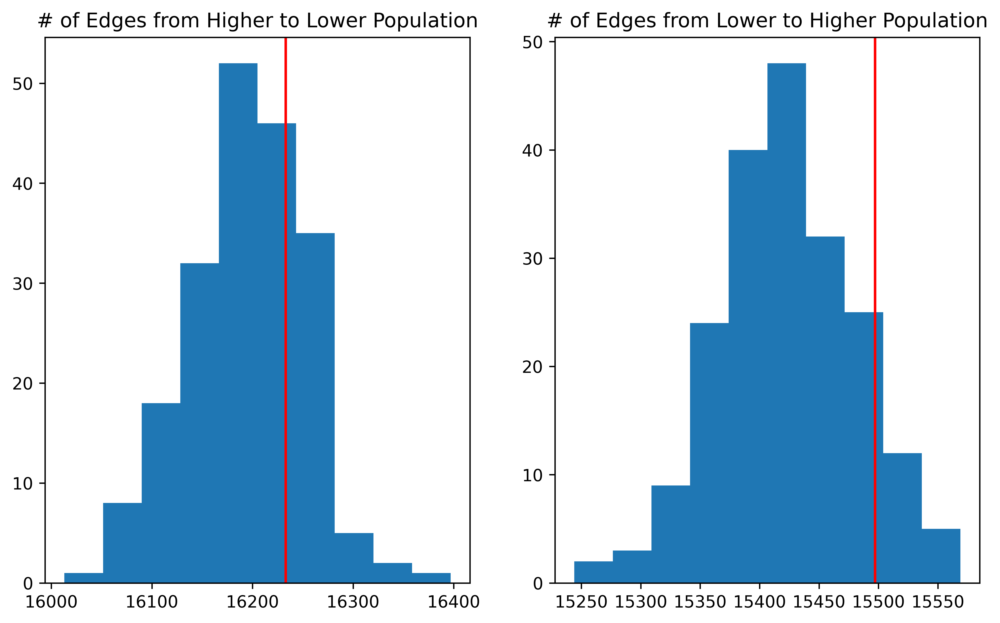

In [672]:
fig, axs = plt.subplots(ncols=2, figsize=[10, 6])
axs[0].hist(popInfluenceDist)
axs[0].set_title("# of Edges from Higher to Lower Population")
axs[0].axvline(influencedByPop, color="red")

axs[1].hist(noPopInfluenceDist)
axs[1].set_title("# of Edges from Lower to Higher Population")
axs[1].axvline(notInfluencedByPop, color="red")


In [621]:
print(list(configModel.out_degree())[:10])
print(list(configModel.))
print(list(outletGraph.out_degree())[:10])

[('abcnews', 237), ('addisoncountyindependent', 31), ('advertiserdemocrat', 35), ('alamedatimesstar', 212), ('alaskajournalofcommerce', 103), ('albertleatribune', 238), ('albuquerquejournal', 241), ('andalusiastarnews', 112), ('arizonacapitoltimes', 136), ('arkansastimes', 217)]
[('abcnews', 237), ('addisoncountyindependent', 31), ('advertiserdemocrat', 35), ('alamedatimesstar', 212), ('alaskajournalofcommerce', 103), ('albertleatribune', 238), ('albuquerquejournal', 241), ('andalusiastarnews', 112), ('arizonacapitoltimes', 136), ('arkansastimes', 217)]


Text(0.5, 0.98, 'Node Degree Distributions')

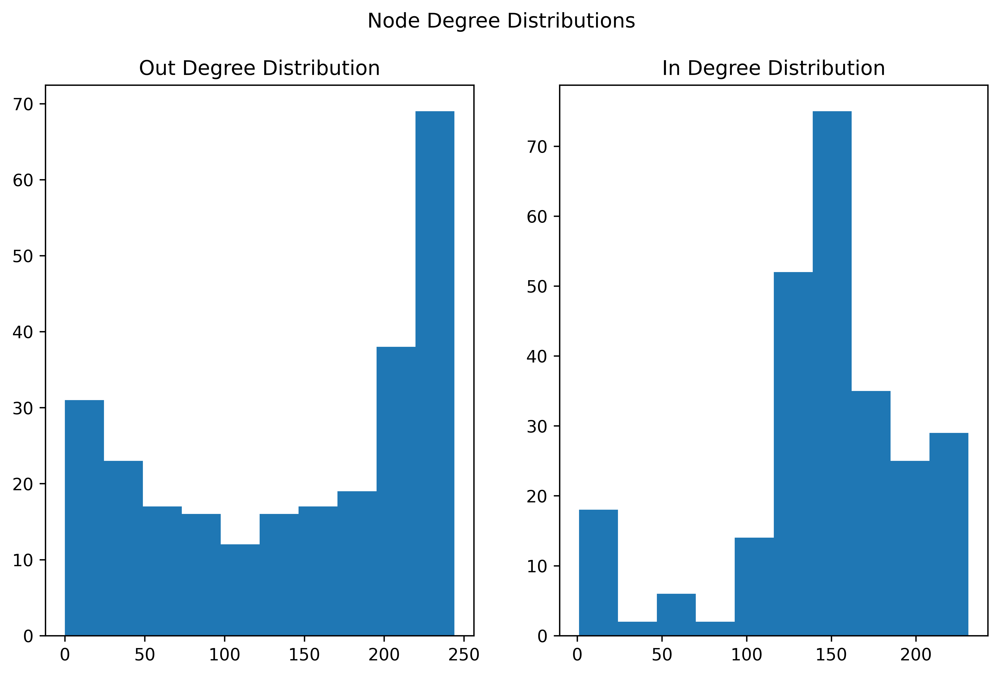

In [615]:
#plot in and out degree across our nodes 
outDegree = [tup[1] for tup in outletGraph.out_degree()]
inDegree = [tup[1] for tup in outletGraph.in_degree()]

fig, axs = plt.subplots(ncols=2, figsize = [10, 6])
axs[0].hist(outDegree)
axs[0].set_title("Out Degree Distribution")

axs[1].hist(inDegree)
axs[1].set_title("In Degree Distribution")
fig.suptitle("Node Degree Distributions")

In [609]:
outletGraph.out_degree()

OutMultiDegreeView({'abcnews': 237, 'addisoncountyindependent': 31, 'advertiserdemocrat': 35, 'alamedatimesstar': 212, 'alaskajournalofcommerce': 103, 'albertleatribune': 238, 'albuquerquejournal': 241, 'andalusiastarnews': 112, 'arizonacapitoltimes': 136, 'arkansastimes': 217, 'atlantadailyworld': 229, 'atmoreadvance': 144, 'aurorasentinel': 233, 'austindailyherald': 234, 'bainbridgeislandreview': 208, 'bartonchronicle': 78, 'bossierpresstribune': 226, 'bostonherald': 241, 'boulderweekly': 124, 'broomfieldenterprise': 138, 'businessinsider': 224, 'businessnewsnj': 168, 'businessreport': 179, 'camaswashougalpostrecord': 94, 'campbellreporter': 167, 'cascadebusinessnews': 72, 'cbsnews': 242, 'centralkitsapreporter': 199, 'chathamjournal': 204, 'chicagosuntimes': 233, 'chronicleindependent': 4, 'citybusiness': 210, 'clantonadvertiser': 35, 'claytontribune': 13, 'clearlakemirrorreporter': 0, 'cnbc': 225, 'cnn': 240, 'communityadvocate': 76, 'contracostatimes': 237, 'craigdailypress': 128,